# Detect blurry images 

## Import packages

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from dyslexia import preprocessing
from dyslexia.io import load_image
from dyslexia.ocr import extract_text_from_image
from dyslexia.plots import plot_image, plot_2_images

import seaborn as sns
import os
from os.path import join, isdir, isfile
from os import listdir
import time

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
%env TESSDATA_PREFIX C:/Users/arthu/Travail/DataForGood/tessdata

env: TESSDATA_PREFIX=C:/Users/arthu/Travail/DataForGood/tessdata


## Get files

In [4]:
from utils import load_all_files_path

subdir_paths, all_files = load_all_files_path()

## Create preprocess function

In [5]:
def preprocess_image(image):    
    image_no_shadow = preprocessing.remove_shadow(image)
    
    image_gray = preprocessing.image_to_gray(image_no_shadow, threshold=True)

    angle = preprocessing.find_best_rotation_angle(image_gray)

    image_fixed = preprocessing.rotate_img(image_gray, angle=angle)
    
    return image_fixed

## Blur detection

### First, try variance of Laplacian, thresholded arbitrarily (to be tuned)

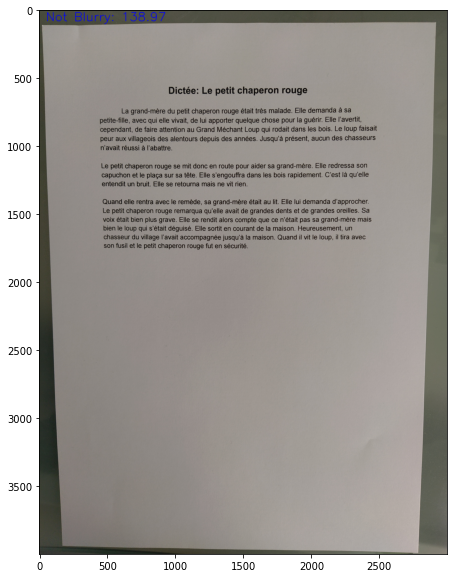

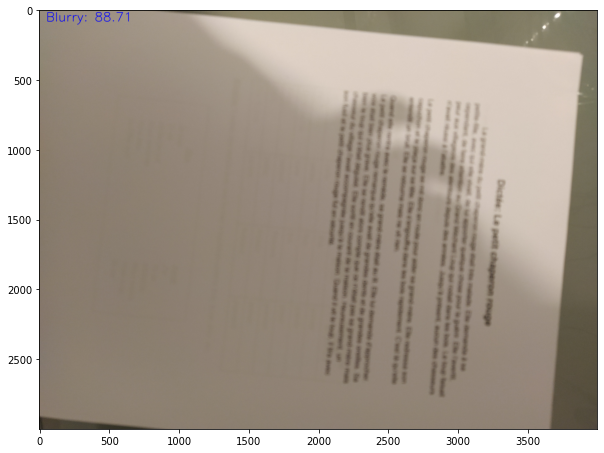

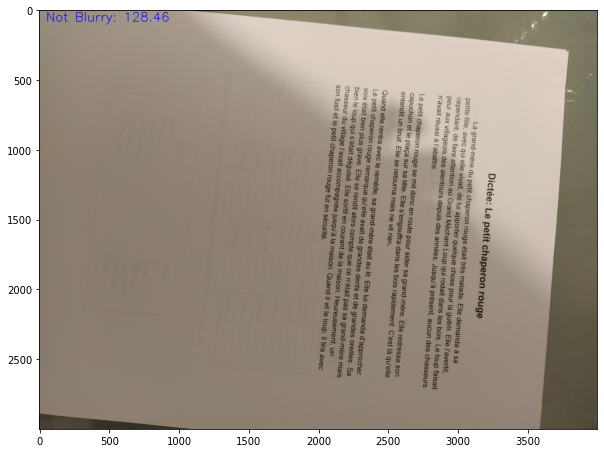

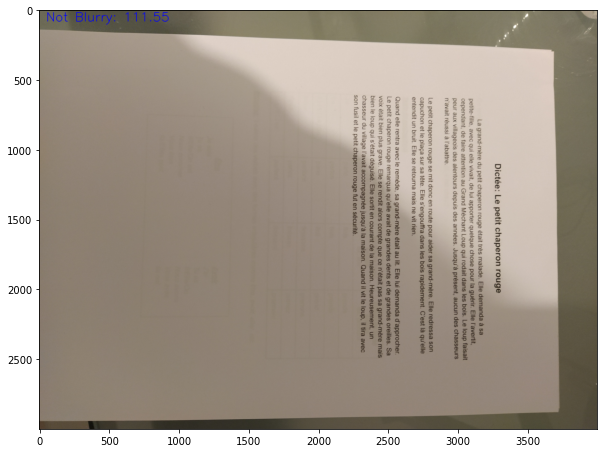

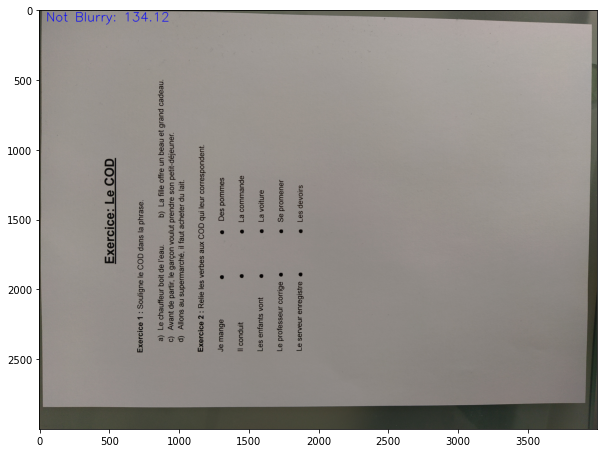

...

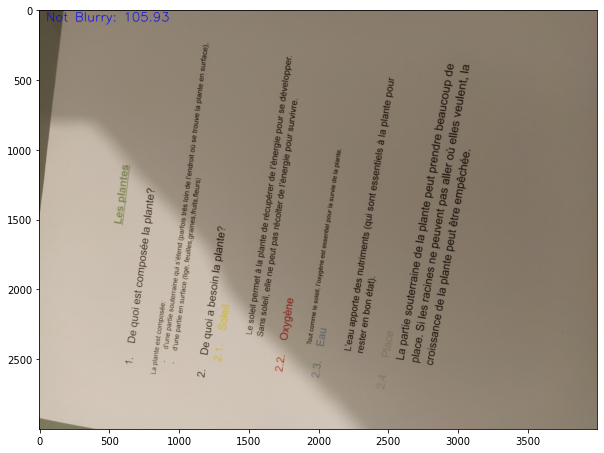

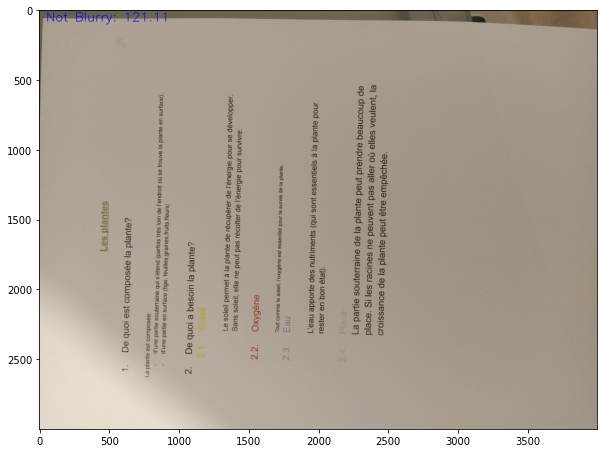

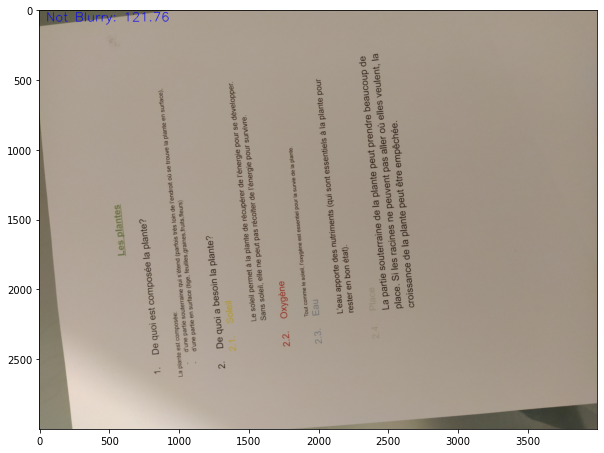

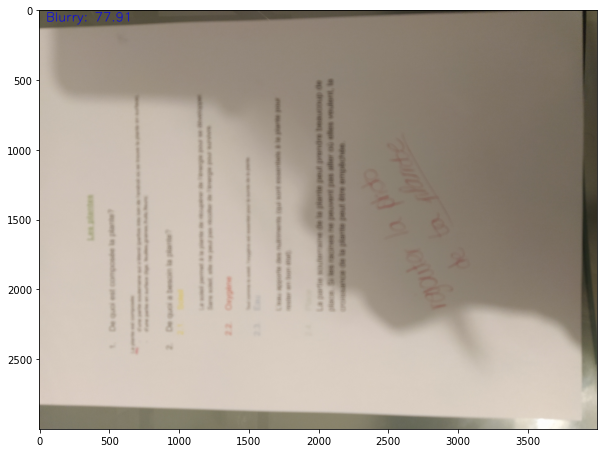

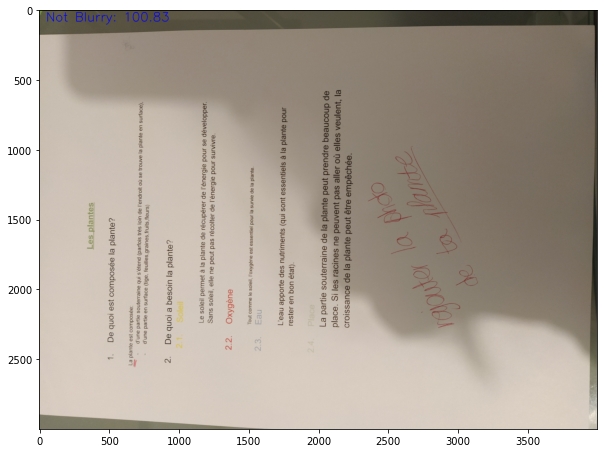

In [6]:
from imutils import paths
import cv2

threshold = 100 
def variance_of_laplacian(image):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    return cv2.Laplacian(image, cv2.CV_64F).var()

for p in all_files :
    image = load_image(p)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    fm = variance_of_laplacian(gray)
    text = "Not Blurry"
    if fm < threshold:
        text = "Blurry"
    
    cv2.putText(image, "{}: {:.2f}".format(text, fm), (50, 80),
        cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 3)
    plot_image(image)

This method works okay-ish, some good classification, some bad. I feel like the shadow might induce blurriness that isn't. Better work on preprocessed images. 

Moreover, we'll try another method based on SVMs

## Second try, maximum of laplacian and variance of laplacian + SVMs

Idea : for two kernels (laplacian and sobel) compute the variance and the maximum value for each image. Then scatter plot each entry in a graph with coordinate (var,max) and hopefully the blurry and not blurry classes will be linearly separable. \\n
I had to label the images by hand here

In [11]:
true_class = [1,0,1,1,1,1,1,0,0,1,1,1,1,1,1,1,1,1,0,0,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1]
dictionnary ={}
for i,elm in enumerate(all_files) : 
    dictionnary[elm]=true_class[i]

In [15]:
import numpy as np 

from scipy.ndimage import variance
from skimage import io
from skimage.color import rgb2gray
from skimage.filters import laplace
from skimage.filters import sobel
from skimage.transform import resize
import seaborn as sns
import pandas as pd

variance_laplace=[]
maximum_laplace=[]
variance_sobel=[]
maximum_sobel=[]
# Load image
for path in dictionnary.keys() :
    img = io.imread(path)
    
    img = preprocess_image(img)

    # Resize image
    img = resize(img, (400, 600))

    # Grayscale image
    #img = rgb2gray(img)
    # Edge detection
    edge_laplace = laplace(img, ksize=3)
    edge_sobel = sobel(img)

    variance_laplace.append(variance(edge_laplace))
    maximum_laplace.append(np.amax(edge_laplace))
    
    variance_sobel.append(variance(edge_sobel))
    maximum_sobel.append(np.amax(edge_sobel))
    # Print output

<AxesSubplot:title={'center':'Using Sobel'}, xlabel='max_s', ylabel='var_s'>

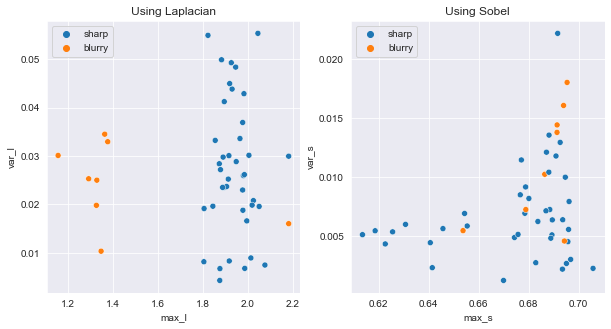

In [18]:
sns.set_style('darkgrid')
df_laplace = pd.DataFrame(np.array([maximum_laplace, variance_laplace,true_class]).transpose(), columns = ["max_l", "var_l","hue"])
df_sobel = pd.DataFrame(np.array([maximum_sobel, variance_sobel,true_class]).transpose(), columns = ["max_s","var_s","hue"])
hue_str = ["sharp" if true_class[i]==1 else "blurry" for i in range(len(true_class))]
plt.figure(figsize = (10,5))
plt.subplot(1,2,1)
plt.title('Using Laplacian')
sns.scatterplot(x = df_laplace['max_l'], y = df_laplace['var_l'], hue = hue_str)
plt.subplot(1,2,2)
plt.title('Using Sobel')
sns.scatterplot(x = df_sobel['max_s'] , y = df_sobel['var_s'], hue = hue_str)

In the case of the Laplacian the two classes are linearly separable except for an outlyer that is very blurry on the top left corner and good elsewhere

We can use an SVM to separate those classes (given we get more data) and then we could classify new images as blurry, not blurry, or "don't know for sure" for those in the margin of the SVM